<a href="https://colab.research.google.com/github/slyofzero/MNISTGans/blob/main/MNIST_cGAN_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
import os
import uuid
from pathlib import Path
import re

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"
f"Using device - {device}"

'Using device - cuda'

## Preparing Data

In [18]:
mnist_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
])

download = False
if not os.path.isdir('./data/MNIST'):
    download = True

mnist_data = datasets.MNIST("./data", transform=mnist_transform, download=download)

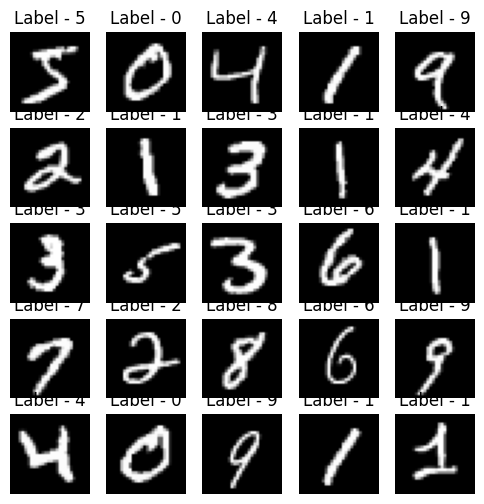

In [19]:
n=5
fig, axes = plt.subplots(nrows=n, ncols=n, figsize=(6,6))

for idx, ax in enumerate(axes.flatten()):
  img, label = mnist_data[idx]
  ax.imshow(img[0], cmap="gray")
  ax.set_axis_off()
  ax.set_title(f"Label - {label}")

plt.show()

## GAN

In [20]:
class EncodedTargetsDataset(Dataset):
  def __init__(self, mnist_data):
    self.mnist = mnist_data

  def __len__(self):
    return len(self.mnist)

  def __getitem__(self, idx):
    image, label = self.mnist[idx]
    image = image.view(-1)
    label = encode_labels(torch.tensor(label))
    return image, label

def encode_labels(labels):
    labels = labels.long()  # enforce dtype
    assert labels.min() >= 0
    assert labels.max() < classes_count
    return nn.functional.one_hot(labels, num_classes=classes_count).float()

classes_count = len(mnist_data.classes)
mnist_encoded_dataset = EncodedTargetsDataset(mnist_data)

In [21]:
class Discriminator(nn.Module):
  def __init__(self, img_dim):
    super().__init__()
    self.network = nn.Sequential(
        nn.Linear(img_dim, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, 128),
        nn.LeakyReLU(0.2),
        nn.Linear(128, 1),
        nn.Sigmoid()
    )

  def forward(self, X):
    return self.network(X)

class Generator(nn.Module):
  def __init__(self, noise_dim, img_dim):
    super().__init__()
    self.network = nn.Sequential(
        nn.Linear(noise_dim, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, 512),
        nn.LeakyReLU(0.2),
        nn.Linear(512, img_dim),
        nn.Tanh()
    )

  def forward(self, X):
    return self.network(X)

In [22]:
class MNIST_GAN():
  def __init__(self, z_dim, img_dim, targets_dim, lr=3e-4, device=device, save_folder="./mnist_checkpoints", save_name="mnist_gan"):
    # Save folder for model loading
    self.save_folder = save_folder
    if not os.path.isdir(self.save_folder):
      os.makedirs(self.save_folder)
    self.save_name = save_name
    self.save_path = f"{self.save_folder}/{self.save_name}.pth"

    # Model making
    features_dim = img_dim + targets_dim
    noise_dim = z_dim + targets_dim

    self.device = device

    # Networks
    self.discriminator = Discriminator(img_dim=features_dim).to(device)
    self.generator = Generator(noise_dim=noise_dim, img_dim=img_dim).to(device)

    # Optimizers
    self.optimizer_disc = optim.Adam(self.discriminator.parameters(), lr=lr)
    self.optimizer_gen = optim.Adam(self.generator.parameters(), lr=lr)

    self.criterion = nn.BCELoss()

    self.discriminator.train()
    self.generator.train()

  def load_save(self, save_path=""):
    if save_path == "":
      save_path = self.save_path

    metadata = {}
    if not os.path.isfile(save_path):
      raise Exception(f"The mnist_gan save doesn't exist at {save_path}.")
    else:
      ckpt = torch.load(save_path, map_location=device)
      model, metadata = ckpt["model"], ckpt["metadata"]

      self.discriminator.load_state_dict(model["discriminator"])
      self.generator.load_state_dict(model["generator"])
      self.optimizer_disc.load_state_dict(model["optimizer_disc"])
      self.optimizer_gen.load_state_dict(model["optimizer_gen"])

      self.discriminator.to(device)
      self.generator.to(device)

    return metadata

  def save(self, metadata={}, save_path=""):
    if save_path == "":
      save_path = self.save_path

    info_to_save = {
        "model": {
          "discriminator": self.discriminator.state_dict(),
          "optimizer_disc": self.optimizer_disc.state_dict(),
          "generator": self.generator.state_dict(),
          "optimizer_gen": self.optimizer_gen.state_dict(),
        },
        "metadata": metadata
    }

    torch.save(info_to_save, save_path)

  def train(self, train_loader, max_epochs, fixed_noise, save_after_epochs=10, warm_restart=False, save_path="", save_on_epoch=False):
    # run_name = f"run_{uuid.uuid4().hex[:8]}"
    print(f"Using {self.device} for training.")

    writer_fake = SummaryWriter(f"runs/GAN_MNIST/fake")
    writer_real = SummaryWriter(f"runs/GAN_MNIST/real")

    step = 0
    epochs_trained = 0

    if save_path == "":
      save_path = self.save_path

    if warm_restart:
      try:
        metadata = self.load_save(save_path=save_path)
        epochs_trained = metadata["epochs_trained"]
        print(f"Loaded save from {save_path}. Epochs trained so far - {metadata["epochs_trained"]}.\n")
      except Exception as e:
        print(e, end=" ")
        print("Continuing without a save.\n")

    self.discriminator.train()
    self.generator.train()

    # print(f"Run [{run_name}]")

    total_epochs = max_epochs + epochs_trained # As epochs can vary for pre-trained networks

    # Running epochs
    for epoch in range(max_epochs):
      current_epoch = epochs_trained + 1 # As epochs can vary for pre-trained networks

      for batch_idx, (real, labels) in enumerate(train_loader):
        # Resizing real data to match nn input size
        curr_batch_size = real.size(0)
        real = real.view(curr_batch_size, -1).to(device)
        labels = labels.view(curr_batch_size, -1).to(device)

        real_labels = torch.ones(curr_batch_size, device=device)
        fake_labels = torch.zeros(curr_batch_size, device=device)

        # ========================================
        # 1. Training the discriminator
        # ========================================

        # Loss for real samples
        real_injected = self.inject_labels(real, labels)
        disc_real = self.discriminator(real_injected).view(-1)
        lossD_real = self.criterion(disc_real, real_labels)

        # Loss for fakes samples
        noise, noise_labels = self.generate_noise_with_labels(curr_batch_size)
        fake = self.generator(noise)
        fake_injected = self.inject_labels(fake, noise_labels)
        disc_fake = self.discriminator(fake_injected.detach()).view(-1)
        lossD_fake = self.criterion(disc_fake, fake_labels)

        # Total discriminator loss
        lossD = lossD_real + lossD_fake

        # Backprop and optimizer step
        self.discriminator.zero_grad()
        lossD.backward()
        self.optimizer_disc.step()

        # ========================================
        # 2.. Training the generator
        # ========================================

        # Generate fake samples again
        noise, noise_labels = self.generate_noise_with_labels(curr_batch_size)
        fake = self.generator(noise)
        fake_injected = self.inject_labels(fake, noise_labels)
        outputs = self.discriminator(fake_injected).view(-1)
        lossG = self.criterion(outputs, real_labels) # trick discriminator into classifying fake samples as real

        # Backprop and optimizer step
        self.generator.zero_grad()
        lossG.backward()
        self.optimizer_gen.step()

        if batch_idx == 0:
          print(
            f"Epoch [{current_epoch}/{total_epochs}] Batch {batch_idx}/{len(data_loader)} \
                  Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
          )

          with torch.no_grad():
            fake = self.generator(fixed_noise).reshape(-1, 1, 28, 28).float()
            data = real.reshape(-1, 1, 28, 28).float()
            img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
            img_grid_real = torchvision.utils.make_grid(data, normalize=True)

            writer_fake.add_image("Mnist Fake Images", img_grid_fake, global_step=current_epoch)
            writer_real.add_image("Mnist Real Images", img_grid_real, global_step=current_epoch)

      epochs_trained += 1
      if (current_epoch % save_after_epochs == 0 or current_epoch == max_epochs):
        metadata = {
          "lr": lr,
          "epochs_trained": epochs_trained
        }

        e_save_path = save_path
        if (save_on_epoch):
          # p = Path(e_save_path)
          # e_save_path = p.with_name(f"{p.stem}_e{current_epoch}{p.suffix}")
          p = Path(e_save_path)
          clean_stem = re.sub(r"_e\d+$", "", p.stem)
          e_save_path = p.with_name(f"{clean_stem}_e{current_epoch}{p.suffix}")

        self.save(metadata, save_path=e_save_path)
        print(f"\nSaved model at {e_save_path}. Epochs trained so far - {epochs_trained}.\n")

  @classmethod
  def generate_noise(cls, curr_batch_size):
    return torch.randn((curr_batch_size, z_dim), device=device)

  @classmethod
  def generate_noise_with_labels(cls, curr_batch_size):
    noise = torch.randn((curr_batch_size, z_dim), device=device) # For evaluation
    noisy_classes = torch.randint(low=0, high=classes_count, size=(curr_batch_size,), device=device)
    noisy_classes = encode_labels(noisy_classes)
    return cls.inject_labels(noise, noisy_classes), noisy_classes

  @classmethod
  def inject_labels(cls, features, labels):
    return torch.cat([features, labels], dim=1)

In [23]:
# Hyperparameters
z_dim = 64
classes_count = len(mnist_data.classes)
img_dim = 1 * 28 * 28

lr = 3e-4
batch_size = 32
epochs = 100

fixed_noise_injected, fixed_noise_labels = MNIST_GAN.generate_noise_with_labels(batch_size) # For evaluation
data_loader = DataLoader(mnist_encoded_dataset, batch_size=batch_size, shuffle=True) # Data

In [26]:
print(f"Labels are -")
fixed_noise_labels_decoded = fixed_noise_labels.argmax(dim=1)
row = 0
cols = 8
for i in range(int(32/cols)):
  row_data = fixed_noise_labels_decoded[row*cols:(row+1)*cols]
  print(f"\t{", ".join(map(str, row_data.tolist()))}")
  row += 1
%tensorboard --logdir runs

Labels are -
	8, 1, 9, 5, 0, 9, 6, 0
	1, 1, 0, 9, 5, 1, 4, 7
	8, 9, 0, 4, 4, 3, 4, 9
	5, 1, 4, 3, 5, 7, 1, 8


<IPython.core.display.Javascript object>

In [27]:
# Model and model training
save_folder = "/content/drive/MyDrive/GenAI/MNIST/mnist_checkpoints/cGAN/mnist_cgan_v2"
save_name = "mnist_cgan_v2"
mnist_gan = MNIST_GAN(z_dim, img_dim, classes_count, device=device, save_folder=save_folder, save_name=save_name)
mnist_gan.train(data_loader, epochs, fixed_noise_injected, save_after_epochs=10, warm_restart=True, save_on_epoch=True)

Using cuda for training.
The mnist_gan save doesn't exist at /content/drive/MyDrive/GenAI/MNIST/mnist_checkpoints/cGAN/mnist_cgan_v2/mnist_cgan_v2.pth. Continuing without a save.

Epoch [1/100] Batch 0/1875                   Loss D: 1.3836, loss G: 0.6636
Epoch [2/100] Batch 0/1875                   Loss D: 0.8421, loss G: 1.9142
Epoch [3/100] Batch 0/1875                   Loss D: 0.6825, loss G: 2.2868
Epoch [4/100] Batch 0/1875                   Loss D: 1.0138, loss G: 0.9810
Epoch [5/100] Batch 0/1875                   Loss D: 1.0522, loss G: 1.7311
Epoch [6/100] Batch 0/1875                   Loss D: 0.8741, loss G: 1.5062
Epoch [7/100] Batch 0/1875                   Loss D: 0.9717, loss G: 2.0693
Epoch [8/100] Batch 0/1875                   Loss D: 0.9623, loss G: 1.3368
Epoch [9/100] Batch 0/1875                   Loss D: 0.8114, loss G: 1.1964
Epoch [10/100] Batch 0/1875                   Loss D: 0.9533, loss G: 1.3356

Saved model at /content/drive/MyDrive/GenAI/MNIST/mnist_ch

In [30]:
# Visualizing the results
def generate_image(generator, label, size, ax):
  with torch.no_grad():
    noise = MNIST_GAN.generate_noise(size)
    noise_labels = encode_labels(torch.full((size,), label, device=device))
    noise_injected = torch.cat([noise, noise_labels], dim=1)

    fake = generator(noise_injected).reshape(-1, 1, 28, 28).float()
    fake = fake.detach().cpu()
    img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)

    ax.imshow(img_grid_fake.permute(1, 2, 0))
    ax.axis("off")
    ax.set_title(f"Label {label}")

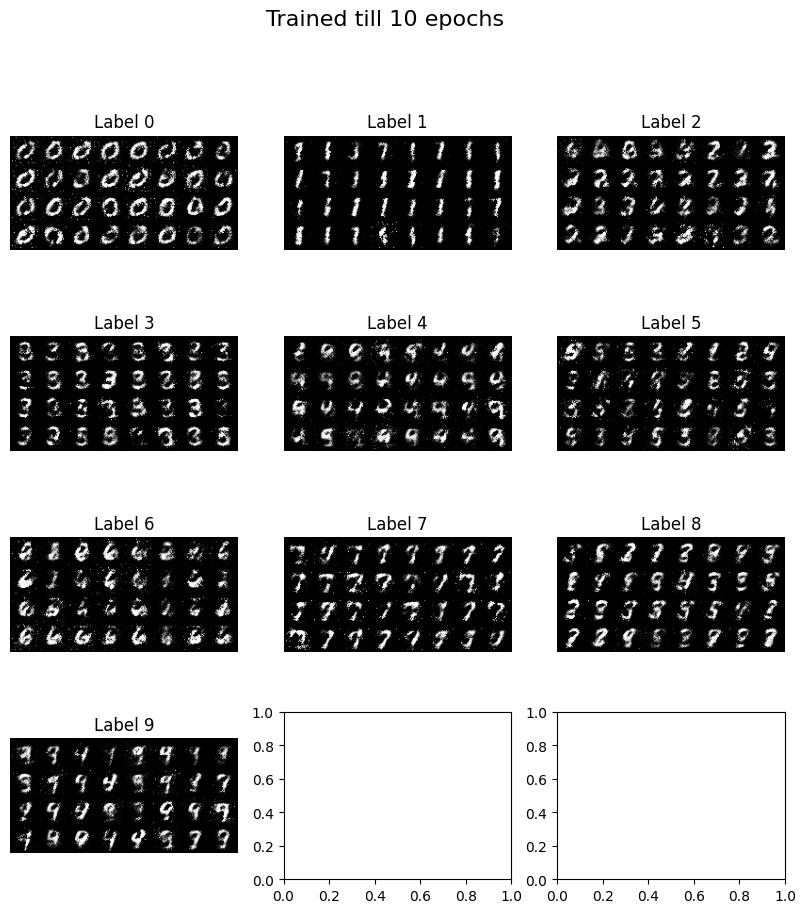

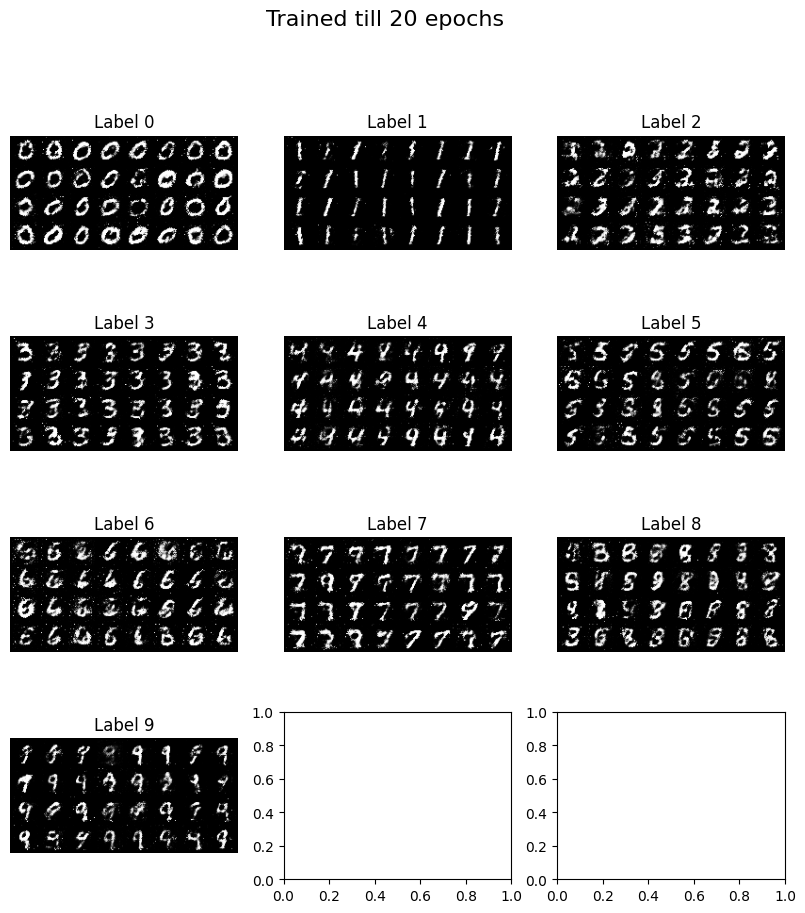

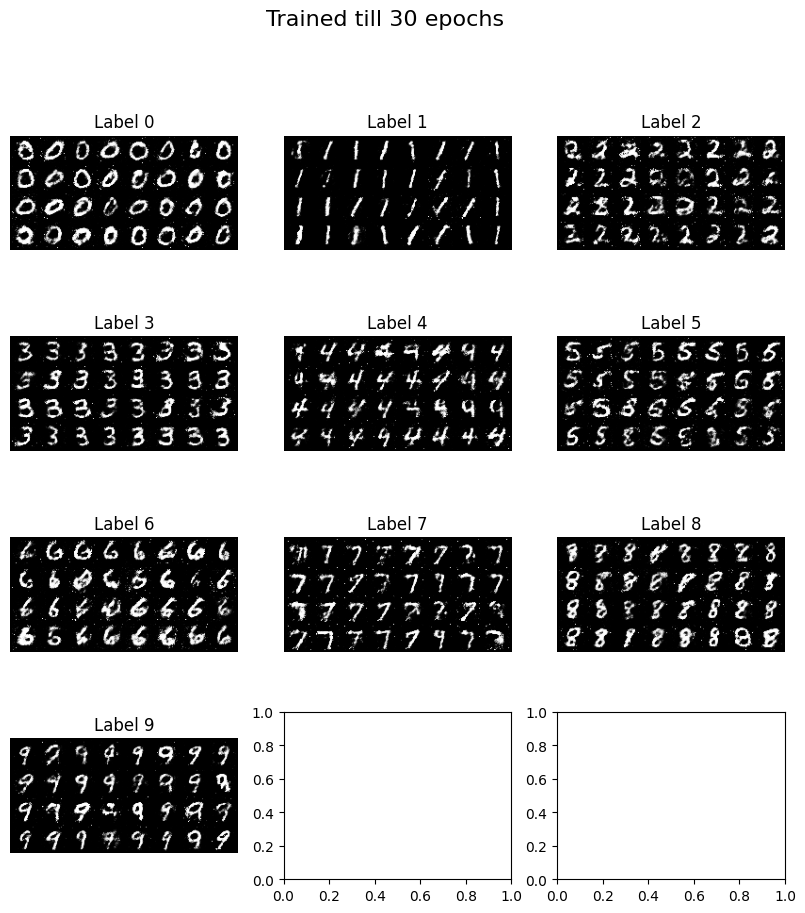

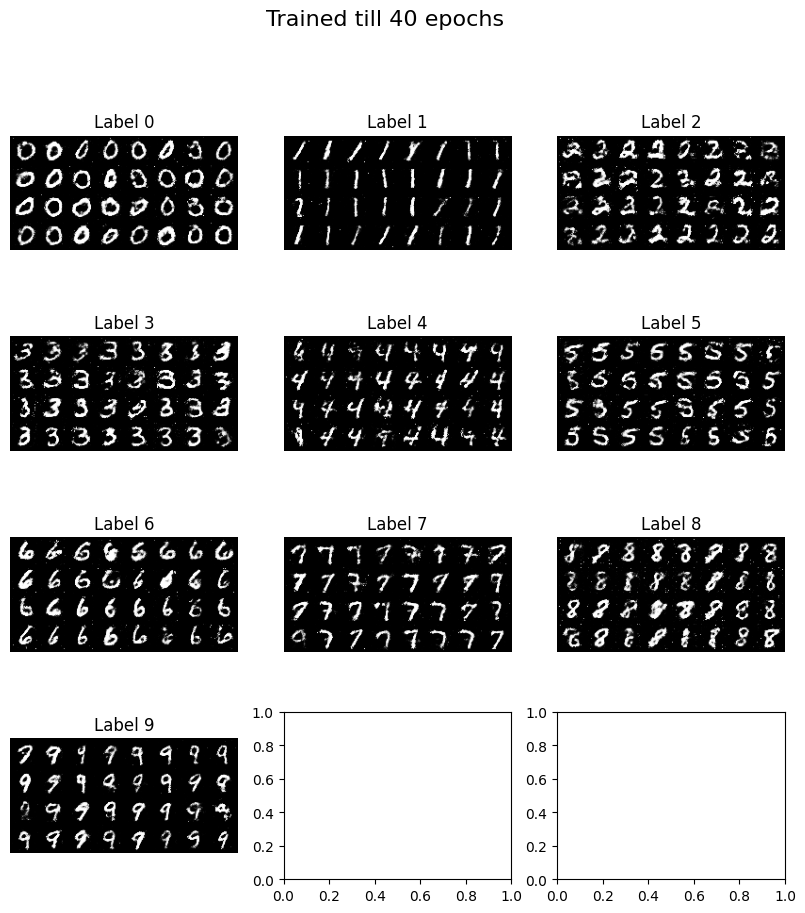

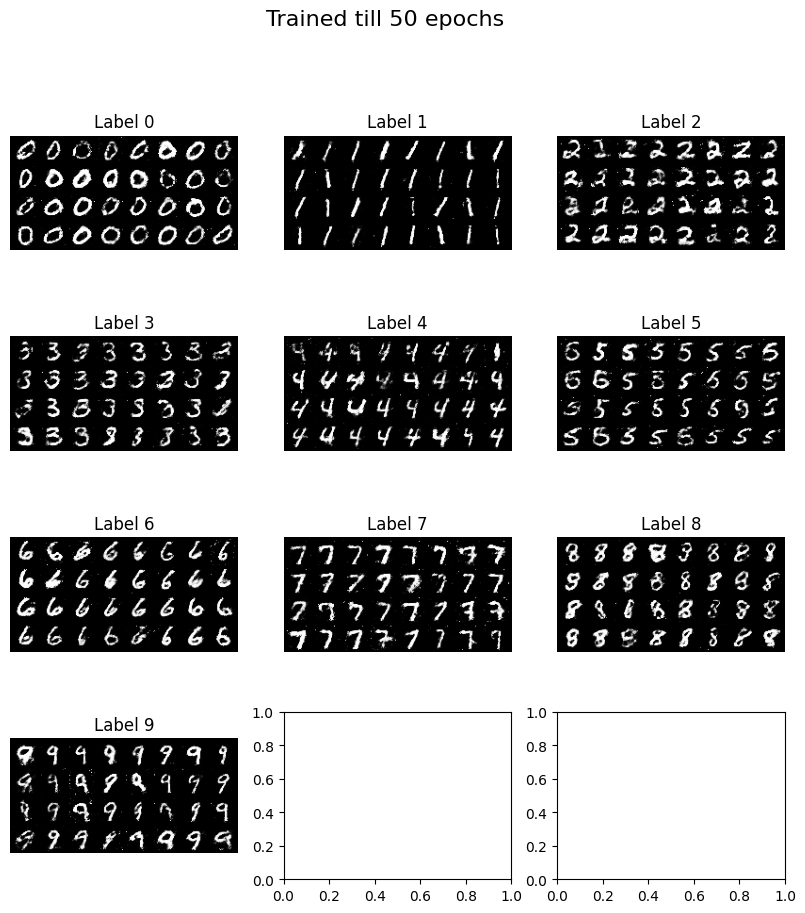

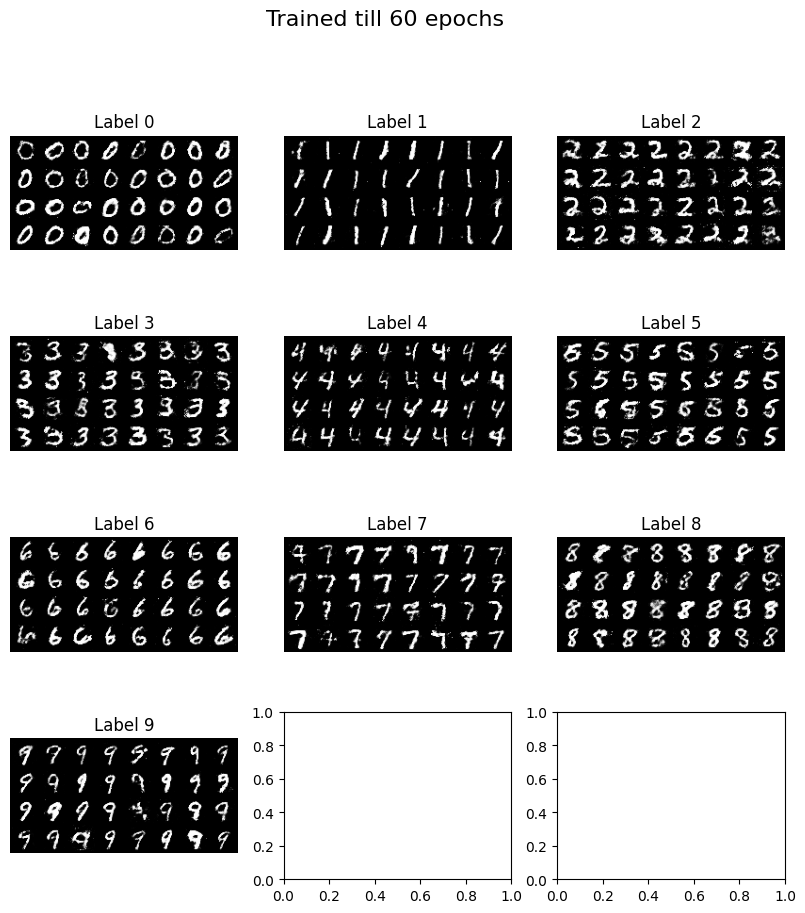

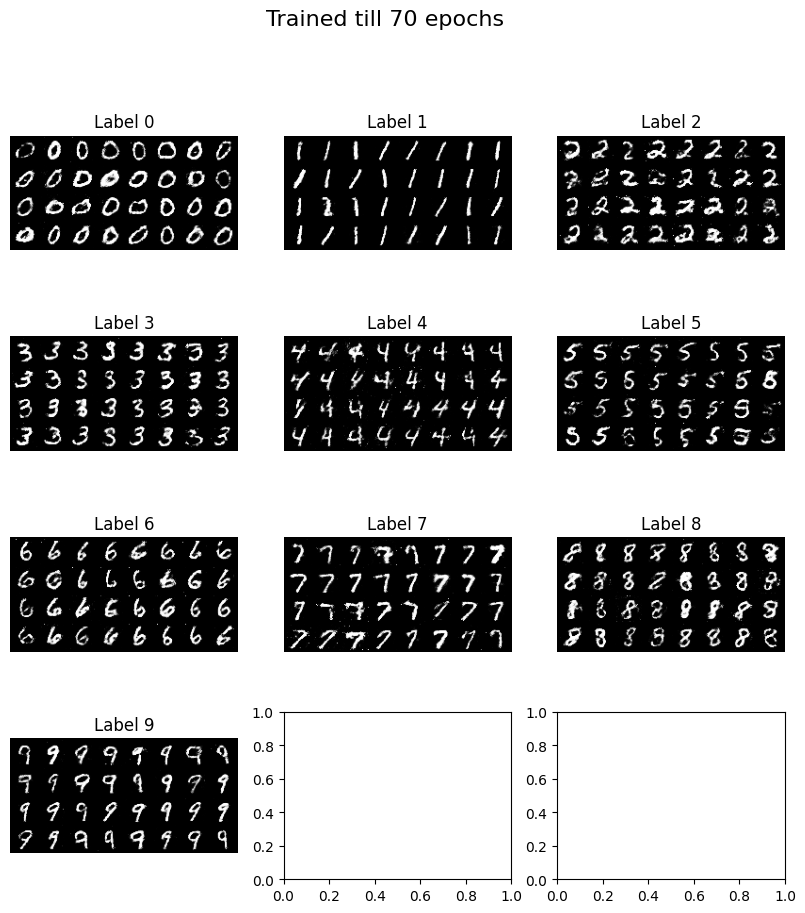

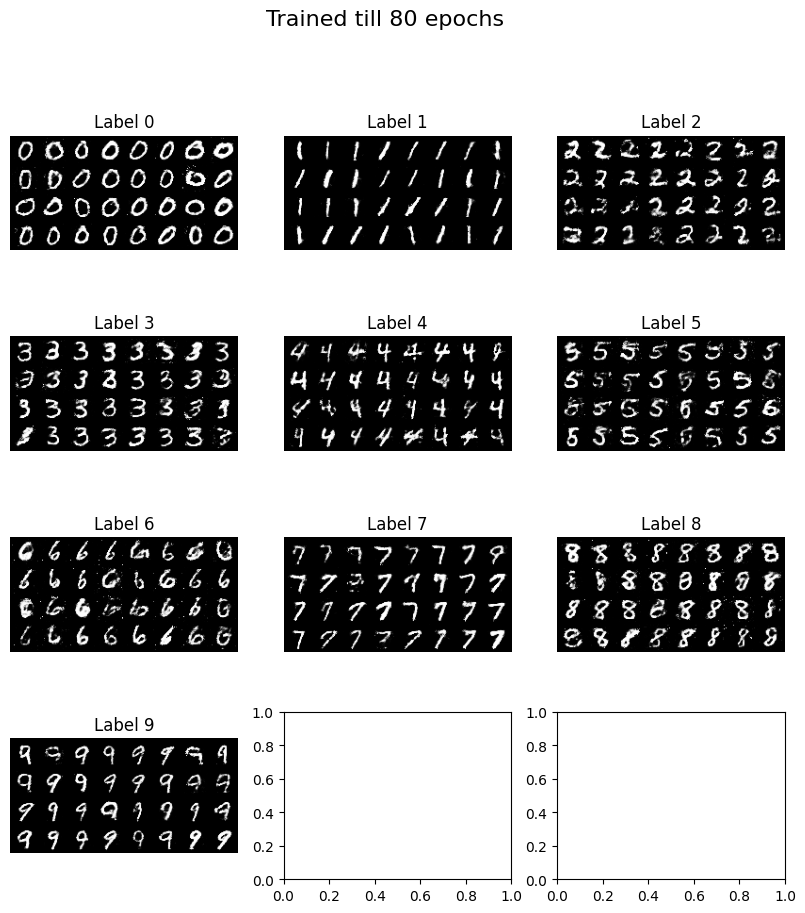

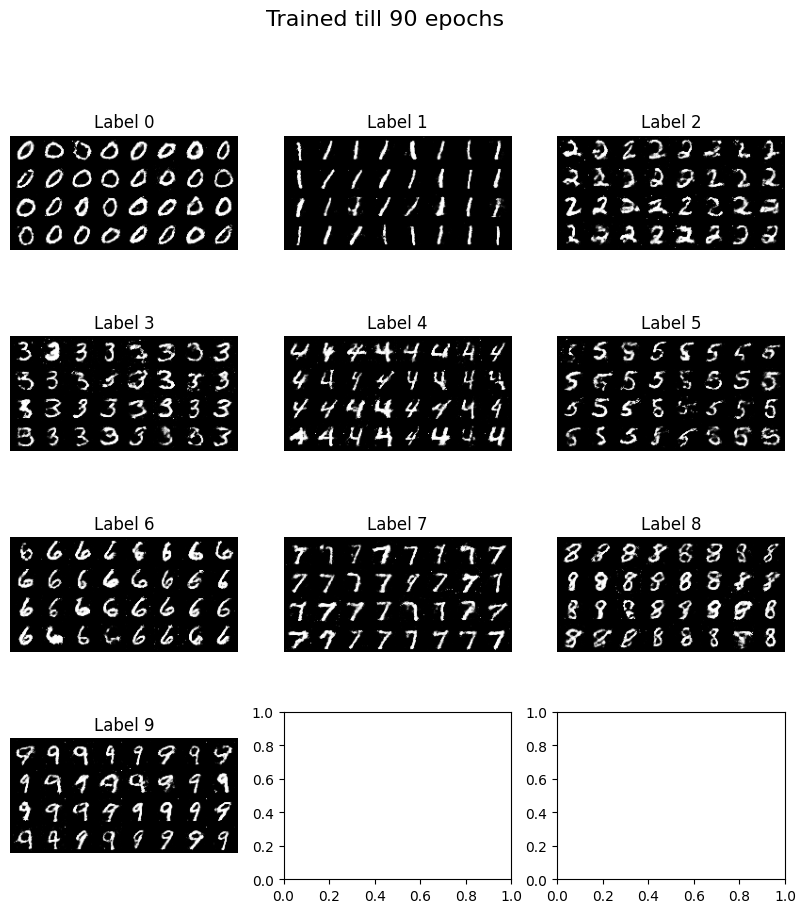

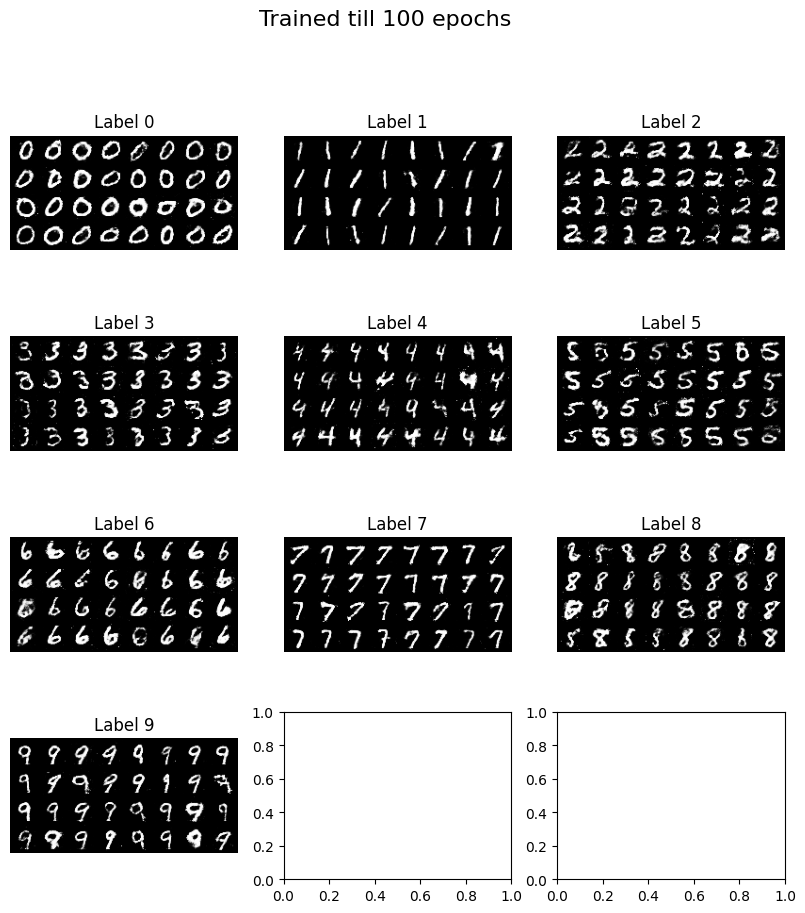

In [40]:
for i in range(1,11):
  epochs = i*10
  snapshot_save = f"{save_name}_e{epochs}"
  temp_gan = MNIST_GAN(z_dim, img_dim, classes_count, device=device, save_folder=save_folder, save_name=snapshot_save)
  temp_gan.load_save()

  fig, axes = plt.subplots(nrows=4,ncols=3,figsize=(10,10))
  fig.suptitle(f"Trained till {epochs} epochs", fontsize=16)

  for label, ax in enumerate(axes.flatten()):
    if label <= 9:
      generate_image(temp_gan.generator, label, batch_size, ax)

  plt.show()

In [ ]:
# fig, axes = plt.subplots(nrows=4,ncols=3,figsize=(10,10))

# for label, ax in enumerate(axes.flatten()):
#   if label <= 9:
#     generate_image(label, batch_size, ax)

# plt.show()